# "Data mining Final Project"
> "bus_stop"

- toc: true
- branch: master
- badges: true
- comments: true
- author: YeEun
- categories: [jupyter, python]

### 데이터 마이닝 기말 프로젝트 

* [1. 분석 배경](#chapter1)
    * [1.1 대회 소개](#section_1_1)
    * [1.2 선정 이유](sSection_1_2)
    * [1.3 방향 및 목적](sSection_1_3)
* [2. 데이터 설명 및 처리](#chapter2)
    * [2.1 패키지 로드](#section_2_1)
    * [2.2 데이터 설명](#section_2_2)
    * [2.3 데이터 전처리](#section_2_3)
* [3. 시각화 및 분석](#chapter3)
    * [3.1 데이터 시각화](#section_3_1)
    * [3.2 분석 결과](#section_3_2)
* [4. 결론](#chapter4)
    * [4.1 최적 노선 제시](#section_4_1)
    * [4.2. 활용 방안](#section_4_2)

### 1. 분석 배경 <a class="anchor" id="chapter1"></a>

- 1.1 대회 소개 <a class="anchor" id="section_1_1"></a>

 - 화성시는 전국 기초단체 중 가장 공장이 많은 지역이며 동탄, 병점 등 신도시의 입주로 인해 2018년 한 해 동안 인구가 가장 많이 증가한 지자체이다. 이에 따른 심각한 교통 문제를 겪고 있다. 
 - 대회의 해결 과제는 화성시 내 인구와 이동형태를 고려하여 관내 시내버스에 대한 노선 신설이나 기존 노선을 개선하는 방안을 제시한다. 

- 1.2 선정 이유 <a class="anchor" id="section_1_2"></a>

 - 국토교통부에서 발표한 2020년 대중교통 이용 현황에 따르면 주 이용 교통수단은 버스인 것을 알 수 있다. 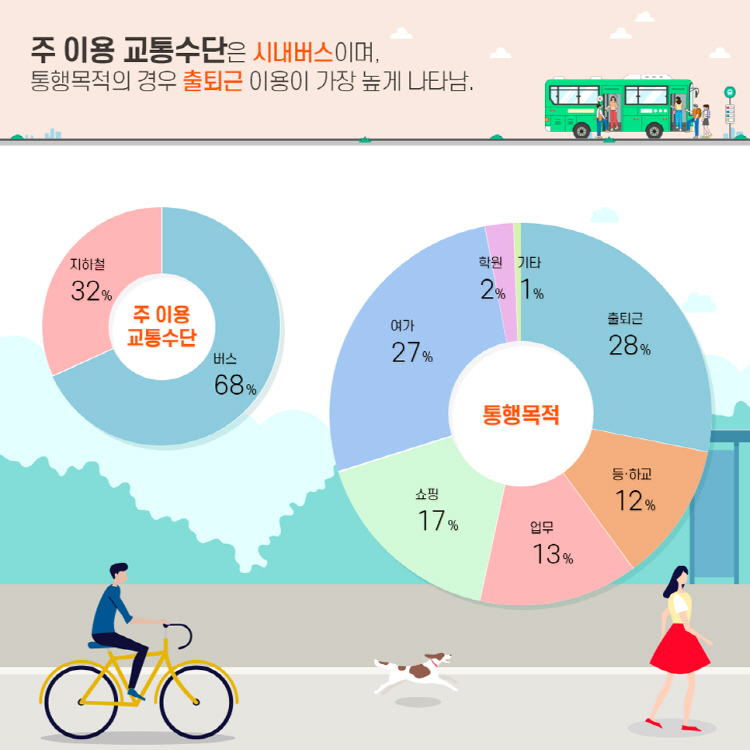



- 
 - 실제로 외출을 할 때 대부분 버스로 이동하며 주변에 학교에서 이용하는 학생이나 여러 아파트 단지에서 이용하는 주민들이 많지만 배차 간격, 환승 등의 불편함을 겪고 대중교통에서 오는 불편함이 큰 것을 알기 때문에 실제 경험을 바탕으로 하여 분석을 진행하기 위해 선정하였다. 

- 1.3 방향 및 목적 <a class="anchor" id="section_1_3"></a>

 - 기본적으로 원래 대회의 목적에 맞추어 진행하였다. 
 - 시각화 결과에 따른 노선 제시로 이어지지만 그래프나 지도 시각화를 통한 분석을 우선으로 진행한다. 
 - 구체화된 완벽한 노선을 제시하기 보다는 유동 인구가 많은 중요한 정류장 포함한 노선 구축을 목적으로 한다. 

### 2. 데이터 설명 및 처리 <a class="anchor" id="chapter2"></a>

#### 2.1 패키지 로드 <a class="anchor" id="section_2_1"></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive') #구글드라이브와 코랩 연결

Mounted at /content/drive


In [ ]:
pip install geopandas # 코랩 geopandas 설치

In [ ]:
pip install pydeck # 코랩 pydeck 설치

In [16]:
import pandas as pd
import numpy as np
import geopandas as gpd
import pydeck
import folium
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
#한글깨짐방지 폰트 설정
plt.rc('font', family='NanumGothic')
from matplotlib import rc
import matplotlib.font_manager as fm
fm._rebuild()
fm.get_fontconfig_fonts()
font_location = '/content/drive/MyDrive/NanumGothic.ttf' # 폰트 파일 이름, 디렉토리
font_name = fm.FontProperties(fname=font_location).get_name()
matplotlib.rc('font', family=font_name)

In [51]:
from matplotlib import font_manager
import matplotlib
matplotlib.font_manager._rebuild()
for i in font_manager.fontManager.ttflist:
    if 'Nanum' in i.name:
        print(i.name, i.fname)

#### 2.2 데이터 설명 <a class="anchor" id="section_2_1"></a>

- TripChain 
 - 버스 탑승 정보, 승하차역 정보, 환승 정보

In [8]:
TripChain = pd.read_csv('/content/drive/MyDrive/TripChain_re.csv')
TripChain.head()

,암호화카드번호||','||환승횟수||','||사용자구분||','||버스노선ID1||','||버스노선ID2||','||버스노선ID3||','||버스노선ID4||','||버스노선ID5||','||차량ID1||','||차량ID2||',...,'||총탑승시간||','||총소요시간||','||최초승차일시||','||최종하차일시||','||승차역ID1||','||승차역ID2||','||승차역ID3||','||하차역ID4||','||하차역ID5||','||최종하차역ID||'
0,900079696430,2,1,41002045.0,41002044.0,NaN,NaN,NaN,141771735.0,141771587.0,...,25,25,20180701052543,20180701064826,4116828.0,4150144.0,NaN,NaN,NaN,4116708.0
1,900079697651,1,1,41031040.0,NaN,NaN,NaN,NaN,141701792.0,NaN,...,3,3,20180701072156,20180701072520,4117280.0,NaN,NaN,NaN,NaN,4117269.0
2,900079698254,1,1,41031121.0,NaN,NaN,NaN,NaN,141701843.0,NaN,...,66,66,20180701123653,20180701134223,4199619.0,NaN,NaN,NaN,NaN,4107936.0
3,900079699257,1,1,41031013.0,NaN,NaN,NaN,NaN,141701450.0,NaN,...,1,1,20180701224424,20180701224543,4108130.0,NaN,NaN,NaN,NaN,4116717.0
4,900079701419,1,1,41020001.0,NaN,NaN,NaN,NaN,141703985.0,NaN,...,8,8,20180701085058,20180701085910,4100122.0,NaN,NaN,NaN,NaN,4116848.0


- station_table 
 - 정류소 ID, 위치, 위도, 경도

In [19]:
station_table = pd.read_csv('/content/drive/MyDrive/stations_table.csv')
station_table

,표준정류장ID,시군명,정류소명,정류소영문명,정류소번호,중앙차로여부,관할관청,위치,WGS84위도,WGS84경도,모바일정류장ID,이비카드정류장ID
0,228003422,용인시,손골마을회관.국제학교,"Songol Community Center,",56443.0,노변정류장,경기도 용인시,NaN,37.342517,127.066817,56443.0,NaN
1,228003423,용인시,풀잎사랑,Pulipsarang,56444.0,노변정류장,경기도 용인시,NaN,37.341800,127.068983,56444.0,NaN
2,228003424,용인시,풀잎사랑,Pulipsarang,56445.0,노변정류장,경기도 용인시,NaN,37.341817,127.069083,56445.0,NaN
3,228003425,용인시,대성공정,Daesung Process,56446.0,노변정류장,경기도 용인시,NaN,37.339350,127.073067,56446.0,NaN
4,228003426,용인시,대성공정,Daesung Process,56447.0,노변정류장,경기도 용인시,NaN,37.339183,127.073400,56447.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
38504,228003381,용인시,현대빌리지,Hyundai Village,56402.0,노변정류장,경기도 용인시,NaN,37.326433,127.071317,56402.0,NaN
38505,228003382,용인시,현대빌리지,Hyundai Village,56403.0,노변정류장,경기도 용인시,NaN,37.326450,127.071100,56403.0,NaN
38506,236001229,포천시,평강식물원,Pyunggang Botanical Garden,40691.0,노변정류장,경기도 포천시,경기도 포천시 영북면,38.050650,127.306617,40691.0,NaN
38507,236001230,포천시,양문1리.영중면사무소,"Yangmun 1-ri, Yeongjung-myeon Office",40699.0,노변정류장,경기도 포천시,NaN,38.005517,127.245667,40699.0,NaN


- emd_scco_geo
 - 화성시 읍면동 geometry, 이름, 코드

In [18]:
emd_scco_geo =gpd.read_file(open('/content/drive/MyDrive/tl_scco_emd.geojson', encoding='utf-8'))
emd_scco_geo

,id,emd_cd,emd_eng_nm,emd_kor_nm,geometry
0,2122,41590400,Yanggam-myeon,양감면,"MULTIPOLYGON (((126.99921 37.12304, 126.99906 ..."
1,2123,41590410,Jeongnam-myeon,정남면,"MULTIPOLYGON (((127.00591 37.18681, 127.00595 ..."
2,2087,41590116,Jinan-dong,진안동,"MULTIPOLYGON (((127.03486 37.22713, 127.03491 ..."
3,2088,41590117,Byeongjeom-dong,병점동,"MULTIPOLYGON (((127.02686 37.20033, 127.02680 ..."
4,2089,41590118,Neung-dong,능동,"MULTIPOLYGON (((127.05947 37.19984, 127.05948 ..."
5,2090,41590119,Gisan-dong,기산동,"MULTIPOLYGON (((127.05295 37.21400, 127.05278 ..."
6,2091,41590120,Banwol-dong,반월동,"MULTIPOLYGON (((127.06647 37.24009, 127.06650 ..."
7,2092,41590121,Banjeong-dong,반정동,"MULTIPOLYGON (((127.04253 37.24702, 127.04263 ..."
8,2093,41590122,Hwanggye-dong,황계동,"MULTIPOLYGON (((127.02352 37.22536, 127.02611 ..."
9,2094,41590123,Baeyang-dong,배양동,"MULTIPOLYGON (((126.99364 37.23062, 126.99370 ..."


- cell_pop 
 - 인구밀도, geometry

In [20]:
cell_pop = gpd.read_file(open('/content/drive/MyDrive/h_100m_cell_pop.geojson', encoding='utf-8'))
cell_pop

,id,pop_mn_0_9,pop_mn_10_,pop_mn_20_,pop_mn_30_,pop_mn_40_,pop_mn_50_,pop_mn_60_,pop_mn_70_,pop_mn_80_,...,pop_wmn_40,pop_wmn_50,pop_wmn_60,pop_wmn_70,pop_wmn_80,pop_wmn_90,pop_wmn_tt,pop_ttl,emd_cd,geometry
0,1,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,...,0.0,3.0,1.0,0.0,0.0,0.0,4.0,7.0,None,"POLYGON ((126.74685 37.03640, 126.74797 37.036..."
1,2,0.0,0.0,1.0,0.0,1.0,3.0,0.0,1.0,0.0,...,0.0,4.0,0.0,0.0,0.0,0.0,4.0,10.0,None,"POLYGON ((126.74572 37.03730, 126.74684 37.037..."
2,4,2.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,2.0,0.0,2.0,0.0,0.0,6.0,12.0,None,"POLYGON ((126.74797 37.03730, 126.74909 37.037..."
3,16,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,3.0,5.0,None,"POLYGON ((126.74570 37.04271, 126.74682 37.042..."
4,18,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,5.0,8.0,None,"POLYGON ((126.68357 37.11554, 126.68470 37.115..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10642,10643,1.0,1.0,2.0,2.0,1.0,3.0,3.0,1.0,0.0,...,1.0,4.0,2.0,1.0,0.0,0.0,16.0,30.0,41590132,"POLYGON ((127.14281 37.20598, 127.14393 37.205..."
10643,10644,1.0,0.0,1.0,0.0,2.0,3.0,1.0,0.0,0.0,...,1.0,3.0,0.0,0.0,0.0,0.0,8.0,16.0,41590132,"POLYGON ((127.14393 37.20598, 127.14506 37.205..."
10644,10645,0.0,1.0,1.0,0.0,2.0,1.0,0.0,1.0,0.0,...,3.0,0.0,0.0,1.0,0.0,0.0,6.0,12.0,41590132,"POLYGON ((127.14393 37.20688, 127.14506 37.206..."
10645,10646,0.0,0.0,2.0,0.0,0.0,1.0,2.0,0.0,0.0,...,1.0,2.0,1.0,0.0,0.0,0.0,5.0,10.0,41590132,"POLYGON ((127.14506 37.20688, 127.14619 37.206..."


- moc_link
 - link ID, node, road name, geometry

In [21]:
moc_link = gpd.read_file(open('/content/drive/MyDrive/moc_link_2018.geojson', encoding='utf-8'))
moc_link

,id,link_id,f_node,t_node,road_use,lanes,road_rank,road_name,multi_link,connect,...,dept_code,stnl_reg,road_type,road_no,tmpid,upload_id,sosfnodeid,sostnodeid,shape_stle,geometry
0,63255,2333070000,2330045500,2330045200,0,1.0,107,-,0,000,...,41590,233,000,-,NTIC_0616 U,None,TEMP1074,TEMP1073,154.657772,"MULTILINESTRING ((126.81451 37.14096, 126.8155..."
1,63119,2330018207,2330007302,2330007304,0,2.0,103,일반국도43호선,0,000,...,41590,233,000,43,None,None,None,None,235.832927,"MULTILINESTRING ((126.91828 37.14319, 126.9186..."
2,63120,2330018108,2330007305,2330007304,0,2.0,103,일반국도43호선,0,000,...,41590,233,000,43,None,None,None,None,77.012754,"MULTILINESTRING ((126.91982 37.14574, 126.9197..."
3,63150,2333144900,2330079100,2330076000,0,2.0,107,-,0,000,...,41590,233,000,-,None,None,TEMP846,TEMP636,368.373468,"MULTILINESTRING ((127.04169 37.20703, 127.0417..."
4,63176,2230004902,2330009100,2330009101,0,1.0,106,지방도314호선,0,000,...,41590,233,000,314,None,None,None,None,2351.958941,"MULTILINESTRING ((127.00177 37.16565, 127.0017..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10558,298721,2280726100,2280260400,2280260100,0,1.0,107,고매로43번길,0,000,...,60170,228,000,-,TMPID20180618112952,geostoryco20180709161522,TMPID20180618111732,TMPID20180618111733,246.410905,"MULTILINESTRING ((127.11885 37.23641, 127.1187..."
10559,298722,2280726200,2280260400,2280260300,0,1.0,107,고매로43번길,0,000,...,60170,228,004,-,TMPID20180618112957,geostoryco20180709161522,TMPID20180618111732,TMPID20180618111731,118.352306,"MULTILINESTRING ((127.11872 37.23639, 127.1187..."
10560,298723,2280726300,2280260300,2280260400,0,1.0,107,고매로43번길,0,000,...,60170,228,004,-,TMPID20180618112958,geostoryco20180709161522,TMPID20180618111731,TMPID20180618111732,128.318085,"MULTILINESTRING ((127.11847 37.23533, 127.1186..."
10561,298724,2280726400,2280260600,2280260500,0,2.0,107,-,0,000,...,60170,228,000,-,TMPID20180618113003,geostoryco20180709161522,TMPID20180618111741,TMPID20180618111740,486.744967,"MULTILINESTRING ((127.12064 37.22955, 127.1206..."


#### route_mapping
- 운수사 정보, 이비노선 ID, 표준노선 ID, 노선명(버스번호)

In [23]:
route_mapping = pd.read_csv('/content/drive/MyDrive/routestationmapping.csv')
route_mapping

,구분,운수사명,운수사ID,이비노선ID,표준노선ID,노선명
0,경기시내,경원여객M,2805000,216000044,28050900,M6410
1,경기시내,강화운수,4100100,232000028,41001001,2
2,경기시내,강화운수,4100100,232000029,41001013,88
3,경기시내,강화운수,4100100,232000061,41001020,3000
4,경기시내,강화운수,4100100,232000067,41001024,388
...,...,...,...,...,...,...
2122,경기시내,서현운수,4108800,229000060,41088004,330
2123,경기시내,서현운수,4108800,229000063,41088005,850
2124,경기시내,코레일네트웍스,4108900,213000024,41089001,8507
2125,경기시내,신성교통,4109100,229000102,41091900,M7111


- route_info
 - 버스정류장 이름, 노선 ID, 정류장 ID, 모바일 정류장 ID

In [25]:
route_info = pd.read_csv('/content/drive/MyDrive/routestationinfo.csv')
route_info.head()

,seq,pr_station_id,bus_line_no,bus_line_no_seq,station_nm,station_id,mobile_no
0,65286,228000018,10-4,1,용인터미널,228001552,47634.0
1,65287,228000018,10-4,2,용인터미널(경유),277102443,NaN
2,65288,228000018,10-4,3,포브스병원,228000443,29439.0
3,65289,228000018,10-4,4,제일교회,228000665,29881.0
4,65290,228000018,10-4,5,라이프아파트,228000664,29457.0


#### 2.3 데이터 전처리 <a class="anchor" id="section_2_1"></a>

In [27]:
Trip_new = pd.merge(TripChain,route_mapping,  how='left', left_on = "'||버스노선ID1||'", right_on = '표준노선ID').drop(["'||사용자구분||'", "'||총통행거리||'", "'||총탑승시간||'","'||총소요시간||'"], axis = 1)
# TripChain,route_mapping 데이터셋을 합친 후 사용하지 않는 열 제거

- station_table 전처리

In [30]:
station_table = station_table.dropna() # na값 제거
station_table = station_table[station_table['시군명'] == '화성시'] # 시군명이 화성시인 행을 제외하고 모두 삭제
station_table['emd'] = station_table['위치'].str[7:11] # 주소정보에서 읍면동만 추출
station_table = station_table[~station_table['emd'].str.contains('구')] # 화성시는 읍면동 데이터만 있는데 위치는 수원시이지만 관할구청이 화성시이기 때문에 포함되어있던 행 제거
station_table['emd'] = station_table['emd'].str.strip() # emd 열의 공백 제거

,표준정류장ID,시군명,정류소명,정류소영문명,정류소번호,중앙차로여부,관할관청,위치,WGS84위도,WGS84경도,모바일정류장ID,이비카드정류장ID,emd
15072,233100553,화성시,우미제일.전하리교회,"Woomi Jeil, Jeonhari Church",37760.0,노변정류장,경기도 화성시,경기도 화성시 석우동,37.212133,127.079383,[None None None None None None None None None ...,4130121.0,석우동
22829,233000001,화성시,수영오거리.방송통신대입구,"Suyeong Ogeori, Korea National Open University",2051.0,노변정류장,경기도 화성시,경기도 수원시 권선구 오목천동,37.237717,126.962400,[None None None None None None None None None ...,4116687.0,권선구
22830,233000002,화성시,한국농수산대학,Korea National College of Agriculture and Fish...,36161.0,노변정류장,경기도 화성시,경기도 화성시 봉담읍,37.229317,126.970433,[None None None None None None None None None ...,4116684.0,봉담읍
22831,233000003,화성시,상두2리,Sangdu 2-ri,37320.0,노변정류장,경기도 화성시,경기도 화성시 향남읍,37.101367,126.948400,[None None None None None None None None None ...,4130294.0,향남읍
22832,233000004,화성시,대양2리,Daeyang 2-ri,36108.0,노변정류장,경기도 화성시,경기도 화성시 양감면,37.086417,126.942483,[None None None None None None None None None ...,4130270.0,양감면
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36481,233001145,화성시,덕다리입구,Deokdari,37489.0,노변정류장,경기도 화성시,경기도 화성시 장안면,37.067700,126.838083,[None None None None None None None None None ...,4170855.0,장안면
36482,233001146,화성시,노진초등학교,Nojin Elementary School,36772.0,노변정류장,경기도 화성시,경기도 화성시 장안면,37.052617,126.809567,[None None None None None None None None None ...,4170316.0,장안면
36491,233001148,화성시,노진2리(노인정),Nojin 2-ri Seniors Community Center,36770.0,노변정류장,경기도 화성시,경기도 화성시 장안면,37.049117,126.812383,[None None None None None None None None None ...,4170318.0,장안면
36494,233001149,화성시,노진2리,Nojin 2-ri,37488.0,노변정류장,경기도 화성시,경기도 화성시 장안면,37.047600,126.812850,[None None None None None None None None None ...,4170856.0,장안면


- cell_pop 전처리

unique 함수를 써보면 전체 데이터에서 화성시에 해당하는 읍면동 코드만 있는 것을 볼 수 있다.

In [34]:
cell_pop['emd_cd'].unique()

array([None, '41590256', '41590350', '41590370', '41590360', '41590259',
       '41590400', '41590330', '41590340', '41590262', '41590253',
       '41590410', '41590320', '41590126', '41590124', '41590123',
       '41590125', '41590310', '41590136', '41590139', '41590138',
       '41590137', '41590127', '41590129', '41590135', '41590134',
       '41590133', '41590117', '41590118', '41590116', '41590122',
       '41590119', '41590130', '41590131', '41590128', '41590132',
       '41590121', '41590120'], dtype=object)

화성시가 아닌 데이터가 na로 되어있기 때문에 모두 삭제한다. 

In [37]:
cell_pop = cell_pop.dropna() # 화성시가 아닌 행 즉, None값 제거

읍면동 코드별로 그룹화

In [38]:
grouped = cell_pop['pop_ttl'].groupby(cell_pop['emd_cd']) #emd_cd 별로 pop_ttl 그룹화
grouped = pd.DataFrame(grouped.sum()) # 그룹화 된 값을 더해서 읍면동별 인구수 데이터프레임 생성
grouped['index'] = grouped.index # 인덱스값으로 인덱스 지정

new_emd = pd.merge(emd_scco_geo, grouped, how='inner', on='emd_cd') # emd_scco_geo, grouped 합치기
new_emd = new_emd.drop(['index'], axis = 1) # index 값 제거
new_emd_sort = new_emd.sort_values(by = 'pop_ttl', ascending = False) # pop_ttl 을 기준으로 내림차순 정렬

시각화할 때 y축의 스케일 차이를 줄이기 위해 100을 기준으로 인구 상위권과 하위권 구분

In [ ]:
top_emd = new_emd_sort.head(14)
tail_emd = new_emd_sort.tail(23)

- Tripchain 전처리

사용하지 않는 컬럼 제거

In [13]:
TripChain = TripChain.fillna(0) #데이터 처리를 위해 모든 na값을 0으로 대체
TripChain[["'||버스노선ID1||'","'||버스노선ID2||'","'||버스노선ID3||'","'||버스노선ID4||'","'||버스노선ID5||'", "'||차량ID1||'", "'||차량ID2||'", "'||차량ID3||'", "'||차량ID4||'", "'||차량ID5||'","'||승차역ID1||'","'||승차역ID2||'","'||승차역ID3||'","'||하차역ID4||'","'||하차역ID5||'", "'||최종하차역ID||'"]] = TripChain[["'||버스노선ID1||'","'||버스노선ID2||'","'||버스노선ID3||'","'||버스노선ID4||'","'||버스노선ID5||'", "'||차량ID1||'", "'||차량ID2||'", "'||차량ID3||'", "'||차량ID4||'", "'||차량ID5||'","'||승차역ID1||'","'||승차역ID2||'","'||승차역ID3||'","'||하차역ID4||'","'||하차역ID5||'","'||최종하차역ID||'"]].astype(int)
# 메모리가 소모가 크기 때문에 float 인 데이터를 int로 변환

In [14]:
TripChain.drop(["'||사용자구분||'", "'||총탑승시간||'", "'||총소요시간||'"], axis = 1)

,암호화카드번호||','||환승횟수||','||버스노선ID1||','||버스노선ID2||','||버스노선ID3||','||버스노선ID4||','||버스노선ID5||','||차량ID1||','||차량ID2||','||차량ID3||',...,'||차량ID5||','||총통행거리||','||최초승차일시||','||최종하차일시||','||승차역ID1||','||승차역ID2||','||승차역ID3||','||하차역ID4||','||하차역ID5||','||최종하차역ID||'
0,900079696430,2,41002045,41002044,0,0,0,141771735,141771587,0,...,0,11170,20180701052543,20180701064826,4116828,4150144,0,0,0,4116708
1,900079697651,1,41031040,0,0,0,0,141701792,0,0,...,0,1700,20180701072156,20180701072520,4117280,0,0,0,0,4117269
2,900079698254,1,41031121,0,0,0,0,141701843,0,0,...,0,23180,20180701123653,20180701134223,4199619,0,0,0,0,4107936
3,900079699257,1,41031013,0,0,0,0,141701450,0,0,...,0,500,20180701224424,20180701224543,4108130,0,0,0,0,4116717
4,900079701419,1,41020001,0,0,0,0,141703985,0,0,...,0,3240,20180701085058,20180701085910,4100122,0,0,0,0,4116848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,900016808011,1,41067012,0,0,0,0,141748107,0,0,...,0,4720,20180704152354,20180704154330,4130419,0,0,0,0,4130524
1048571,900016808389,1,41061025,0,0,0,0,141761176,0,0,...,0,4120,20180704163548,20180704165100,4108112,0,0,0,0,4105383
1048572,900016808481,2,41036131,41205007,0,0,0,141705287,141761323,0,...,0,10609,20180704093348,20180704102535,4170340,4116674,0,0,0,4119436
1048573,900016684666,1,41036113,0,0,0,0,141705620,0,0,...,0,3930,20180704084717,20180704090128,4116734,0,0,0,0,4108146


- route_mapping 전처리 

In [24]:
 route_mapping = route_mapping.drop(["운수사명","운수사ID", "구분"], axis = 1) # 사용하지 않는 열 제거

- 출근 시간 시각화 자료

In [39]:
Trip_new["'||최초승차일시||'"] = Trip_new["'||최초승차일시||'"].astype(str) # 시간으로 사용하기 위해  
Trip_new["start_time"] = pd.to_datetime(Trip_new["'||최초승차일시||'"], infer_datetime_format = True) # 시간 형식으로 변환
Trip_new["time_hour"] = Trip_new["start_time"].dt.hour # 시간 추출해서 time_hour 에 저장
time_table = pd.DataFrame(Trip_new.groupby("time_hour")["암호화카드번호||'"].count()) # 시간대별 사용자 수 데이터프레임 생성
time_table['time_hour'] = time_table.index # 인덱스 번호(시간)로 열 생성 
time_table # 시간대별 이용자 수

In [ ]:
plt.figure(figsize = (18,4))
sns.barplot(x="time_hour", y="암호화카드번호||'", data=time_table)
plt.xlabel("시간(0~23시)", fontsize = 20)
plt.ylabel("이용자수(명)", fontsize = 20)

- 위의 코드 실행 시 한글 글꼴이 적용되지 않아 첨부한 원본 그래프 사진

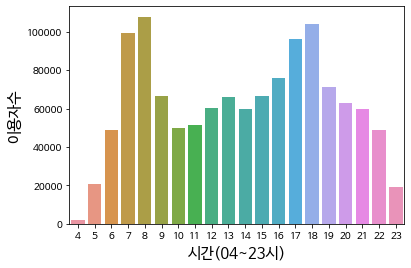

- 출근시간인 7-8시, 퇴근시간인 17-18시에 이용자 수가 가장 많은 것을 볼 수 있다. 

In [55]:
condition = (Trip_new["time_hour"]== 7) | (Trip_new["time_hour"]== 8) # 출퇴근 시간인 7,8시로 조건식 작성
df_work = Trip_new[condition] # 데이터셋에서 이용 시간이 7,8시인 행 추출

In [57]:
df_work.groupby("노선명").count() # 버스 노선 별 이용 횟수

,암호화카드번호||','||환승횟수||','||버스노선ID1||','||버스노선ID2||','||버스노선ID3||','||버스노선ID4||','||버스노선ID5||','||차량ID1||','||차량ID2||','||차량ID3||',...,'||승차역ID1||','||승차역ID2||','||승차역ID3||','||하차역ID4||','||하차역ID5||','||최종하차역ID||',이비노선ID,표준노선ID,start_time,time_hour
노선명,,,,,,,,,,,,,,,,,,,,,
1,107,107,107,107,107,107,107,107,107,107,...,107,107,107,107,107,107,107,107,107,107
1-1,54,54,54,54,54,54,54,54,54,54,...,54,54,54,54,54,54,54,54,54,54
1-2,59,59,59,59,59,59,59,59,59,59,...,59,59,59,59,59,59,59,59,59,59
1-4,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1-5,11,11,11,11,11,11,11,11,11,11,...,11,11,11,11,11,11,11,11,11,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M5107,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5
M5121,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
M5422,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4


In [ ]:
t = pd.DataFrame(Trip_new.groupby("노선명")["암호화카드번호||'"].count()) # 노선명 별 이용 횟수
t.sort_values(by = "암호화카드번호||'", ascending= False).head(10) # 카드번호의 카운트 횟수를 기준으로 내림차순 정렬

,암호화카드번호||'
노선명,
92-1,72343
720-2,58793
3,51687
98,47714
62-1,46534
2-1,42843
13-5,42474
720-1,41148
301,36198


- 이용자 수가 가장 많은 92-1번 버스는 동탄에서 수원을 잇는 버스 노선이다.  

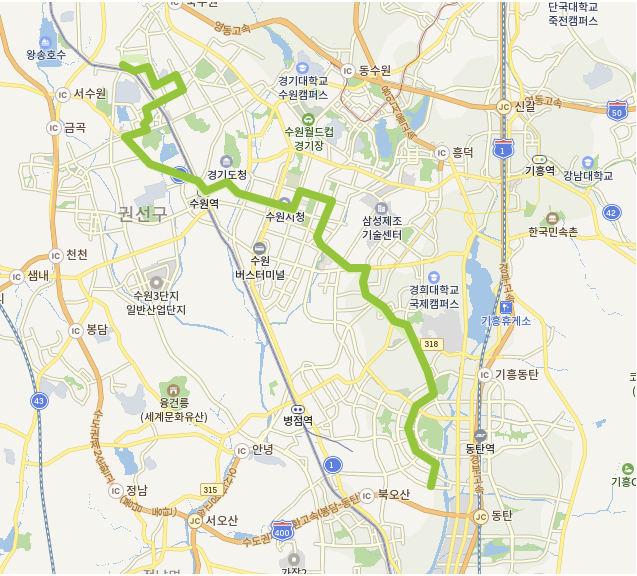


 ⦁ 2018년 7월 승차일 기준 1~4일의 버스 카드태깅 정보을 담은 TripChain 데이터셋 - 
사람마다 환승을 하는 횟수가 다르기 때문에 환승에서 파생된 정보에 NA값 발생한다. 


 ⦁ 17~18년 기준, 경기도 버스 정류장에 대한 정보를 담은 stations_table 데이터셋 - 
경기도 내에 있는 버스정류장 정보를 담았지만 대회에서는 
화성시에 대한 정보만 제공했기 때문에 화성시가 아닌 경우 NA값 발생한다. 

-> 가장 큰 두개의 데이터셋에서 NA가 대량 발생하였고 이 외에는 큰 결측치나 이상치는 없는 것을 확인





### 3. 시각화 및 분석 <a class="anchor" id="chapter2"></a>

- 1차 시각화

In [ ]:
plt.rcParams['font.size'] = 25 # 글씨 크기 설정

In [ ]:
plt.figure(figsize = (45,10)) # 그림 크기 설정
sns.barplot(x="emd_kor_nm", y="pop_ttl", data=new_emd_sort) # x축, y축 설정 후 그래프 그리기
plt.xlabel("읍면동") # x축 이름 
plt.ylabel("인구수(명)") # y축 이름
plt.xticks(rotation=45) # x축에 들어가는 데이터가 많기 때문에 가독성을 위해 x축 글씨 설정

전체적으로 봤을 때는 y축의 스케일 차이가 많이 나서 구분하기 쉽게 보기 위해 상위권과 하위권을 구분지어 시각화

Text(0, 0.5, '인구수')

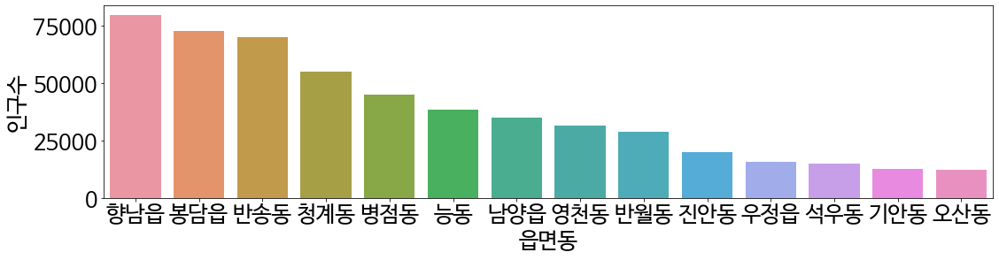

In [ ]:
plt.figure(figsize = (18,4)) # 그림 크기 설정
sns.barplot(x="emd_kor_nm", y="pop_ttl", data=top_emd) # x축, y축 설정 후 그래프 그리기
plt.xlabel("읍면동") # x축 이름
plt.ylabel("인구수") # y축 이름

(array([    0.,  2500.,  5000.,  7500., 10000., 12500.]),
 <a list of 6 Text major ticklabel objects>)

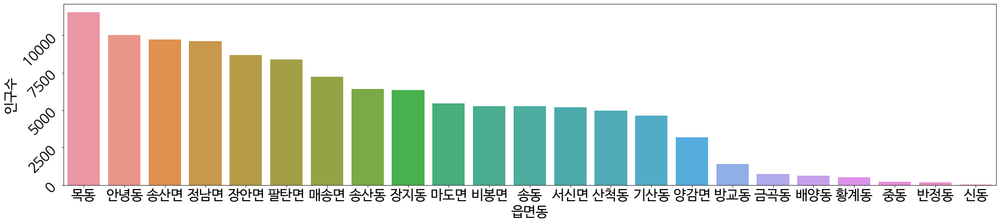

In [ ]:
plt.figure(figsize = (30,6)) # 그림 크기 설정
sns.barplot(x="emd_kor_nm", y="pop_ttl", data=tail_emd) # x축, y축 설정 후 그래프 그리기
plt.xlabel("읍면동") # x축 이름
plt.ylabel("인구수") # y축 이름

- cell_pop 
 - top_emd = 향남읍(41590259), 봉담읍(41590253), 반송동(41590127), 청계동(41590130), 병정동(41590117)
 - tail_emd = 신동(41590133), 양감면(41590400), 서신면(41590350), 중동(41590132), 마도면(41590330)

In [64]:
pop_test = cell_pop.groupby(['emd_cd']).sum().drop(['id'], axis = 1) # 사용하지 않는 id를 제거한 읍면동별 인구수 
pop_test

,pop_mn_0_9,pop_mn_10_,pop_mn_20_,pop_mn_30_,pop_mn_40_,pop_mn_50_,pop_mn_60_,pop_mn_70_,pop_mn_80_,pop_mn_90_,...,pop_wmn_20,pop_wmn_30,pop_wmn_40,pop_wmn_50,pop_wmn_60,pop_wmn_70,pop_wmn_80,pop_wmn_90,pop_wmn_tt,pop_ttl
emd_cd,,,,,,,,,,,,,,,,,,,,,
41590116,916.0,846.0,2049.0,3034.0,2042.0,1282.0,600.0,281.0,86.0,1.0,...,1697.0,1869.0,1380.0,1091.0,600.0,401.0,174.0,0.0,8806.0,19956.0
41590117,2820.0,3446.0,2855.0,3646.0,4718.0,2780.0,1207.0,610.0,207.0,0.0,...,2726.0,3786.0,4725.0,2523.0,1389.0,877.0,322.0,2.0,22507.0,44812.0
41590118,3295.0,2498.0,2074.0,4207.0,3805.0,1815.0,820.0,443.0,122.0,0.0,...,1992.0,4339.0,3604.0,1739.0,1083.0,579.0,234.0,1.0,19112.0,38207.0
41590119,321.0,229.0,289.0,636.0,407.0,250.0,128.0,48.0,8.0,0.0,...,282.0,557.0,381.0,257.0,122.0,50.0,25.0,0.0,2300.0,4617.0
41590120,2284.0,1835.0,1853.0,2794.0,2752.0,1796.0,847.0,278.0,92.0,1.0,...,1664.0,2947.0,2542.0,1839.0,800.0,278.0,173.0,0.0,14197.0,28740.0
41590121,2.0,3.0,11.0,9.0,17.0,25.0,15.0,10.0,4.0,0.0,...,5.0,10.0,10.0,16.0,12.0,15.0,4.0,0.0,77.0,175.0
41590122,8.0,18.0,35.0,22.0,35.0,67.0,50.0,23.0,18.0,0.0,...,21.0,16.0,23.0,37.0,45.0,38.0,27.0,0.0,225.0,503.0
41590123,10.0,27.0,41.0,36.0,45.0,93.0,59.0,31.0,4.0,0.0,...,29.0,15.0,37.0,46.0,42.0,24.0,27.0,0.0,261.0,608.0
41590124,824.0,1012.0,711.0,848.0,1374.0,910.0,450.0,217.0,69.0,1.0,...,650.0,942.0,1293.0,830.0,472.0,262.0,117.0,1.0,6201.0,12620.0


In [68]:
pop_total = pop_test.iloc[:, 0:21].drop(['pop_mn_ttl'], axis = 1) # 위의 데이터셋에서 전체 인구수를 제외
pop_total['index'] = pop_total.index # 인덱스를 열로 생성
pop_total.T.drop(['index'], axis = 0) # 데이터셋 열->행, 행->열로 변환

emd_cd,41590116,41590117,41590118,41590119,41590120,41590121,41590122,41590123,41590124,41590125,...,41590262,41590310,41590320,41590330,41590340,41590350,41590360,41590370,41590400,41590410
pop_mn_0_9,916.0,2820.0,3295.0,321.0,2284.0,2.0,8.0,10.0,824.0,242.0,...,1997.0,241.0,122.0,151.0,285.0,92.0,196.0,254.0,67.0,269.0
pop_mn_10_,846.0,3446.0,2498.0,229.0,1835.0,3.0,18.0,27.0,1012.0,333.0,...,1735.0,286.0,198.0,213.0,426.0,174.0,259.0,333.0,99.0,408.0
pop_mn_20_,2049.0,2855.0,2074.0,289.0,1853.0,11.0,35.0,41.0,711.0,489.0,...,2633.0,528.0,364.0,385.0,598.0,301.0,647.0,559.0,222.0,732.0
pop_mn_30_,3034.0,3646.0,4207.0,636.0,2794.0,9.0,22.0,36.0,848.0,518.0,...,3635.0,426.0,320.0,405.0,511.0,278.0,605.0,538.0,231.0,631.0
pop_mn_40_,2042.0,4718.0,3805.0,407.0,2752.0,17.0,35.0,45.0,1374.0,630.0,...,3211.0,620.0,410.0,492.0,804.0,421.0,860.0,773.0,270.0,931.0
pop_mn_50_,1282.0,2780.0,1815.0,250.0,1796.0,25.0,67.0,93.0,910.0,566.0,...,2885.0,775.0,644.0,631.0,1063.0,641.0,1120.0,1056.0,444.0,1137.0
pop_mn_60_,600.0,1207.0,820.0,128.0,847.0,15.0,50.0,59.0,450.0,352.0,...,1637.0,524.0,481.0,434.0,751.0,516.0,679.0,700.0,280.0,701.0
pop_mn_70_,281.0,610.0,443.0,48.0,278.0,10.0,23.0,31.0,217.0,175.0,...,684.0,271.0,247.0,261.0,449.0,262.0,323.0,423.0,151.0,360.0
pop_mn_80_,86.0,207.0,122.0,8.0,92.0,4.0,18.0,4.0,69.0,51.0,...,281.0,104.0,112.0,105.0,201.0,143.0,143.0,182.0,70.0,151.0
pop_mn_90_,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,2.0,1.0,0.0,3.0,0.0,4.0,0.0,2.0


In [69]:
Te = pop_total.T.drop(['index'], axis = 0) #인덱스 제거
Te

emd_cd,41590116,41590117,41590118,41590119,41590120,41590121,41590122,41590123,41590124,41590125,...,41590262,41590310,41590320,41590330,41590340,41590350,41590360,41590370,41590400,41590410
pop_mn_0_9,916.0,2820.0,3295.0,321.0,2284.0,2.0,8.0,10.0,824.0,242.0,...,1997.0,241.0,122.0,151.0,285.0,92.0,196.0,254.0,67.0,269.0
pop_mn_10_,846.0,3446.0,2498.0,229.0,1835.0,3.0,18.0,27.0,1012.0,333.0,...,1735.0,286.0,198.0,213.0,426.0,174.0,259.0,333.0,99.0,408.0
pop_mn_20_,2049.0,2855.0,2074.0,289.0,1853.0,11.0,35.0,41.0,711.0,489.0,...,2633.0,528.0,364.0,385.0,598.0,301.0,647.0,559.0,222.0,732.0
pop_mn_30_,3034.0,3646.0,4207.0,636.0,2794.0,9.0,22.0,36.0,848.0,518.0,...,3635.0,426.0,320.0,405.0,511.0,278.0,605.0,538.0,231.0,631.0
pop_mn_40_,2042.0,4718.0,3805.0,407.0,2752.0,17.0,35.0,45.0,1374.0,630.0,...,3211.0,620.0,410.0,492.0,804.0,421.0,860.0,773.0,270.0,931.0
pop_mn_50_,1282.0,2780.0,1815.0,250.0,1796.0,25.0,67.0,93.0,910.0,566.0,...,2885.0,775.0,644.0,631.0,1063.0,641.0,1120.0,1056.0,444.0,1137.0
pop_mn_60_,600.0,1207.0,820.0,128.0,847.0,15.0,50.0,59.0,450.0,352.0,...,1637.0,524.0,481.0,434.0,751.0,516.0,679.0,700.0,280.0,701.0
pop_mn_70_,281.0,610.0,443.0,48.0,278.0,10.0,23.0,31.0,217.0,175.0,...,684.0,271.0,247.0,261.0,449.0,262.0,323.0,423.0,151.0,360.0
pop_mn_80_,86.0,207.0,122.0,8.0,92.0,4.0,18.0,4.0,69.0,51.0,...,281.0,104.0,112.0,105.0,201.0,143.0,143.0,182.0,70.0,151.0
pop_mn_90_,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,2.0,1.0,0.0,3.0,0.0,4.0,0.0,2.0


In [70]:
Te.index = ["10대 미만 남자", "10대 남자", "20대 남자", "30대 남자", "40대 남자", "50대 남자", "60대 남자", "70대 남자","80대 남자","90대 남자", "10대 미만 여자", "10대 여자", "20대 여자", "30대 여자", "40대 여자", "50대 여자", "60대 여자", "70대 여자","80대 여자","90대 여자"]
# 인덱스의 이름을 각 나이대별 성별로 지정

- 시각화에서 사용한 범례

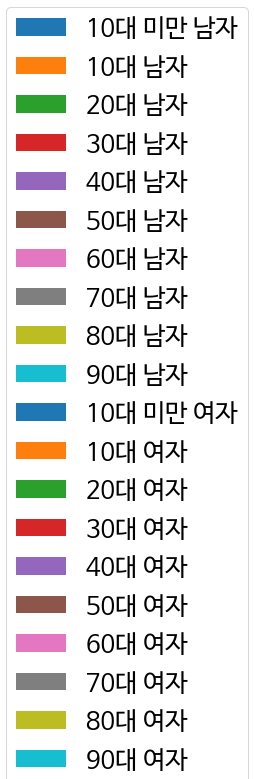

- 인구수 1번 그래프 - 향남읍

Text(0.5, 1.0, '향남읍')

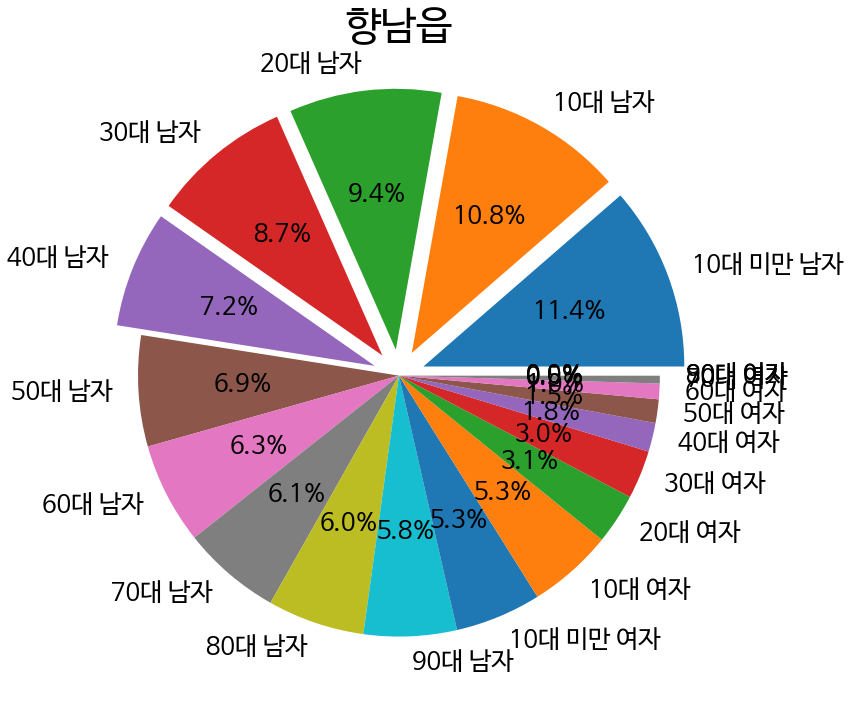

In [ ]:
Te_1 =pd.DataFrame(Te.sort_values(by = '41590259', ascending = False)['41590259']) #인구수가 가장 많은 향남읍의 인구 분포
plt.rcParams['font.size'] = 25 # 글씨 크기 설정 
fig = plt.figure(figsize=(25,12)) # 캔버스 생성
circle_1 = plt.pie(Te_1['41590259'],labels = Te.index,autopct= '%1.1f%%', explode = [0.1,0.1,0.1,0.1,0.1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]) # 중앙에서 떨어진 정도를 설정해서 인구 분포가 많은 나이대 강조
#plt.legend(loc = (1, 1)) # 원래 범례를 사용하였지만 하나의 범례를 사용하기 때문에 일단 그래프에서 범례 제거
plt.title('향남읍', size = 40) # 제목 크기

- 하위 1번 그래프 -신동

Text(0.5, 1.0, '신동')

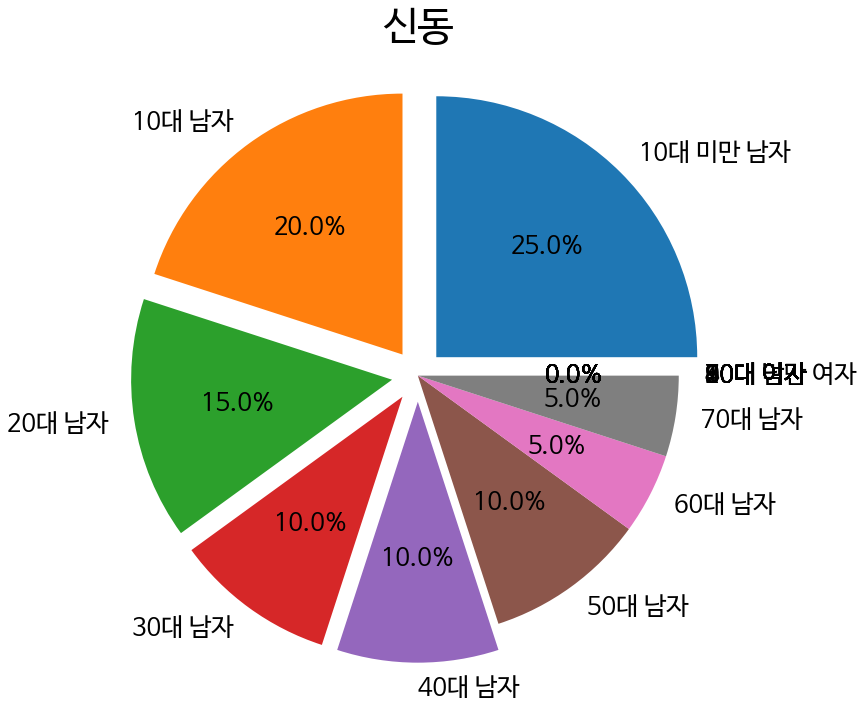

In [ ]:
Te_4 =pd.DataFrame(Te.sort_values(by = '41590133', ascending = False)['41590133']) # 인구수가 가장 적은 신동의 인구 분포 
plt.rcParams['font.size'] = 25 # 글씨 크기 설정
fig = plt.figure(figsize=(25,12)) # 캔버스 생성
circle_4 = plt.pie(Te_4['41590133'],labels = Te.index,autopct= '%1.1f%%', explode = [0.1,0.1,0.1,0.1,0.1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]) # 중앙에서 떨어진 정도를 설정해서 인구 분포가 많은 나이대 강조
#plt.legend(loc = (1, 1)) # 원래 범례를 사용하였지만 하나의 범례를 사용하기 때문에 일단 그래프에서 범례 제거
plt.title('신동', size = 40) # 제목 크기

- 기본적으로 연령대 별 인구 분포에 따라 이용자 수가 나뉘는 것이 아님을 확인하고 신도시이기 때문에 영향을 받는다고 판단할 수 있다. 

- emd 시각화

In [ ]:
districts = emd_scco_geo[["id", "geometry"]].set_index("id") #id를 인덱스로 지정
districts.head() #5개의 데이터로 미리보기

,geometry
id,
2122,"MULTIPOLYGON (((126.99921 37.12304, 126.99906 ..."
2123,"MULTIPOLYGON (((127.00591 37.18681, 127.00595 ..."
2087,"MULTIPOLYGON (((127.03486 37.22713, 127.03491 ..."
2088,"MULTIPOLYGON (((127.02686 37.20033, 127.02680 ..."
2089,"MULTIPOLYGON (((127.05947 37.19984, 127.05948 ..."


In [ ]:
plot_dict = emd_scco_geo.id.value_counts() # id값 추출
plot_dict.head() #5개의 데이터로 미리보기

2122    1
2104    1
2106    1
2107    1
2108    1
Name: id, dtype: int64

In [ ]:
emd_geo = new_emd_sort['geometry'] #geometry 정보 저장
new_emd_sort['pop_ttl'] = new_emd_sort['pop_ttl'].astype(int) # int형으로 변환

In [ ]:
emd_select = new_emd_sort[['id', 'pop_ttl']]  #new_emd_sort 에서 id와 인구수 뽑기

In [ ]:
m = folium.Map(location=[36, 127], tiles="OpenStreetMap", zoom_start=7) # 기본 지도 설정 

m.choropleth(
    geo_data=emd_scco_geo, #geometry 정보를 담은 데이터셋을 설정
    name='인구수',
    data=emd_select, # 지도에 표시되는 데이터셋 지정
    columns=['id', 'pop_ttl'], #id와 인구수 사용
    key_on='feature.properties.id', #id별로 사용 
    color='grey',
    fill_opacity=0.7,
    line_opacity=0.3,
    fill_color = 'PuRd' #크기별 구분 색깔
)


folium.LayerControl(collapsed=False).add_to(m) # 지도에 위에서 크기별로 색깔 변화준 것을 표시
m

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning:

The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.



- 인구 수가 중심구역과 동쪽 지역에 밀집되어 있다. 

- 전체 버스정류장 시각화

In [ ]:
for idx, row in station_table.iterrows():
    folium.Marker([row['WGS84위도'], row['WGS84경도']]).add_to(m) # 위도 경도 표시

m.add_child(folium.LatLngPopup()) # 위도 경도 마커를 지도에 표시

In [ ]:
emd_name_cd = pd.DataFrame(new_emd.loc[:,['emd_cd','emd_kor_nm']]) #읍면동 코드와 이름으로 새로운 데이터셋 생성
emd_name_cd = emd_name_cd.set_index('emd_cd') # 코드를 인덱스로 지정

In [ ]:
emd_name_cd['index'] = emd_name_cd.index # 코드를 열로 생성

In [ ]:
vis_new_data = pd.merge(pop_test, emd_name_cd, left_index = True,right_index = True) # pop_test, emd_name_cd 를 합치기
vis_new_data

,pop_mn_0_9,pop_mn_10_,pop_mn_20_,pop_mn_30_,pop_mn_40_,pop_mn_50_,pop_mn_60_,pop_mn_70_,pop_mn_80_,pop_mn_90_,...,pop_wmn_30,pop_wmn_40,pop_wmn_50,pop_wmn_60,pop_wmn_70,pop_wmn_80,pop_wmn_90,pop_wmn_tt,pop_ttl,emd_kor_nm
emd_cd,,,,,,,,,,,,,,,,,,,,,
41590116,916.0,846.0,2049.0,3034.0,2042.0,1282.0,600.0,281.0,86.0,1.0,...,1869.0,1380.0,1091.0,600.0,401.0,174.0,0.0,8806.0,19956.0,진안동
41590117,2820.0,3446.0,2855.0,3646.0,4718.0,2780.0,1207.0,610.0,207.0,0.0,...,3786.0,4725.0,2523.0,1389.0,877.0,322.0,2.0,22507.0,44812.0,병점동
41590118,3295.0,2498.0,2074.0,4207.0,3805.0,1815.0,820.0,443.0,122.0,0.0,...,4339.0,3604.0,1739.0,1083.0,579.0,234.0,1.0,19112.0,38207.0,능동
41590119,321.0,229.0,289.0,636.0,407.0,250.0,128.0,48.0,8.0,0.0,...,557.0,381.0,257.0,122.0,50.0,25.0,0.0,2300.0,4617.0,기산동
41590120,2284.0,1835.0,1853.0,2794.0,2752.0,1796.0,847.0,278.0,92.0,1.0,...,2947.0,2542.0,1839.0,800.0,278.0,173.0,0.0,14197.0,28740.0,반월동
41590121,2.0,3.0,11.0,9.0,17.0,25.0,15.0,10.0,4.0,0.0,...,10.0,10.0,16.0,12.0,15.0,4.0,0.0,77.0,175.0,반정동
41590122,8.0,18.0,35.0,22.0,35.0,67.0,50.0,23.0,18.0,0.0,...,16.0,23.0,37.0,45.0,38.0,27.0,0.0,225.0,503.0,황계동
41590123,10.0,27.0,41.0,36.0,45.0,93.0,59.0,31.0,4.0,0.0,...,15.0,37.0,46.0,42.0,24.0,27.0,0.0,261.0,608.0,배양동
41590124,824.0,1012.0,711.0,848.0,1374.0,910.0,450.0,217.0,69.0,1.0,...,942.0,1293.0,830.0,472.0,262.0,117.0,1.0,6201.0,12620.0,기안동


- 읍면동별 인구 수 시각화

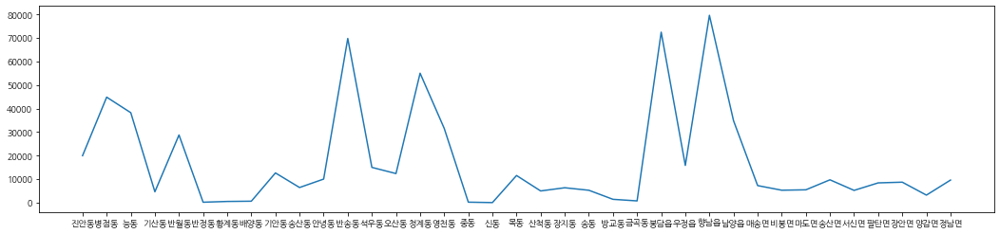

In [ ]:
plt.figure(figsize = (18,4)) # 그림 크기 설정 
plt.plot(vis_new_data['emd_kor_nm'],vis_new_data['pop_ttl']) # 읍면동 이름과 인구수로 그래프 그리기

- 분석을 진행하던 중 station_table 과 cell_pop 의 읍면동 이름이 다른 것을 확인

In [ ]:
station_table['emd'].unique() # station_table 의 읍면동 이름

array(['석우동', '봉담읍', '향남읍', '양감면', '정남면', '병점동', '진안동', '능동', '기산동',
       '반월동', '동탄면', '송산면', '팔탄면', '비봉면', '서신면', '우정읍', '장안면', '매송면',
       '안녕동', '송산동', '기안동', '황계동', '반정동', '마도면', '반송동', '서탄면', '시 탑동',
       '오산동', '영천동', '신장동'], dtype=object)

In [ ]:
vis_new_data['emd_kor_nm'].unique() # vis_new_data 의 읍면동 이름

array(['진안동', '병점동', '능동', '기산동', '반월동', '반정동', '황계동', '배양동', '기안동',
       '송산동', '안녕동', '반송동', '석우동', '오산동', '청계동', '영천동', '중동', '신동', '목동',
       '산척동', '장지동', '송동', '방교동', '금곡동', '봉담읍', '우정읍', '향남읍', '남양읍',
       '매송면', '비봉면', '마도면', '송산면', '서신면', '팔탄면', '장안면', '양감면', '정남면'],
      dtype=object)

- 배양동(기안동), 청계동(동탄4동), 중동(동탄5동), 신동(동탄7동), 목동(동탄7동), 산척동(동탄7동), 장지동(동탄7동), 송동(동탄7동), 방교동(동탄6동), 금곡동(동탄6동), 남양읍(미포함) 
- station_table 과 cell_pop에서 읍면동 이름이 다른 이유는 동탄으로 읍면동이 계속해서 변경되었기 때문에 발생한 문제이다. 
-> 크게 문제가 되지는 않다고 생각하여 그대로 진행하였다. 

In [ ]:
fig = px.scatter_mapbox(station_table, lat = 'WGS84위도', lon = 'WGS84경도',# 위도 경도 설정
                       color = 'emd', # 읍면동별로 색상 설정
                       opacity = 0.4, #투명도
                       hover_name = '정류소명', #정류소 명 표시
                       hover_data = {
                           'WGS84위도' : False,
                           'WGS84경도' : False,
                           'emd' : True # 읍면동 표시
                       },
                       mapbox_style = "carto-positron", # 기본 지도 설정
                       center = dict(lat = 37.15, lon = 126.9), # 지도 중심 설정
                       zoom = 9) # 확대 정도
fig.show() # 지도 보기

In [ ]:
with open('C:\\Users\82108\Desktop\data mining\\tl_scco_emd.geojson', encoding='UTF-8') as f:
    geo_data = json.load(f) # 지도 시각화에 사용하기 위해 geojson 으로 파일 오픈
geo_data

In [ ]:
for x in geo_data['features']:
    x['id'] = x['properties']['emd_kor_nm']
    
for idx, _ in enumerate(geo_data['features']):
    print(geo_data['features'][idx]['id']) 
  
# 지도 시각화를 위한 설정

양감면
정남면
진안동
병점동
능동
기산동
반월동
반정동
황계동
배양동
기안동
송산동
안녕동
반송동
석우동
오산동
청계동
영천동
중동
신동
목동
산척동
장지동
송동
방교동
금곡동
봉담읍
우정읍
향남읍
남양읍
매송면
비봉면
마도면
송산면
서신면
팔탄면
장안면


In [ ]:
emd_scco_geo['id_key'] = (emd_scco_geo.index)*10 #구분을 짓기 위해 index에 10을 곱한 id_key 열 생성
emd_scco_geo

,id,emd_cd,emd_eng_nm,emd_kor_nm,geometry,id_key
0,2122,41590400,Yanggam-myeon,양감면,"MULTIPOLYGON (((126.99921 37.12304, 126.99906 ...",0
1,2123,41590410,Jeongnam-myeon,정남면,"MULTIPOLYGON (((127.00591 37.18681, 127.00595 ...",10
2,2087,41590116,Jinan-dong,진안동,"MULTIPOLYGON (((127.03486 37.22713, 127.03491 ...",20
3,2088,41590117,Byeongjeom-dong,병점동,"MULTIPOLYGON (((127.02686 37.20033, 127.02680 ...",30
4,2089,41590118,Neung-dong,능동,"MULTIPOLYGON (((127.05947 37.19984, 127.05948 ...",40
5,2090,41590119,Gisan-dong,기산동,"MULTIPOLYGON (((127.05295 37.21400, 127.05278 ...",50
6,2091,41590120,Banwol-dong,반월동,"MULTIPOLYGON (((127.06647 37.24009, 127.06650 ...",60
7,2092,41590121,Banjeong-dong,반정동,"MULTIPOLYGON (((127.04253 37.24702, 127.04263 ...",70
8,2093,41590122,Hwanggye-dong,황계동,"MULTIPOLYGON (((127.02352 37.22536, 127.02611 ...",80
9,2094,41590123,Baeyang-dong,배양동,"MULTIPOLYGON (((126.99364 37.23062, 126.99370 ...",90


In [ ]:
fig2 = px.choropleth_mapbox(
   emd_scco_geo, 
   geojson=geo_data, 
   locations='emd_kor_nm', 
   color='id_key',
   color_continuous_scale=px.colors.sequential.Rainbow,
   # featureidkey="properties.CTP_KOR_NM", # featureidkey를 사용하여 id 값을 갖는 키값 지정
   mapbox_style="carto-positron",
   zoom=9, 
   center = {"lat": 37.15, "lon": 126.9}
)
fig2.show()
fig.show()

In [ ]:
fig3 = px.choropleth_mapbox(
   new_emd, 
   geojson=geo_data, 
   locations='emd_kor_nm', 
   color='pop_ttl',
   color_continuous_scale=px.colors.sequential.Blues,
   # featureidkey="properties.CTP_KOR_NM", # featureidkey를 사용하여 id 값을 갖는 키값 지정
   mapbox_style="carto-positron",
   zoom=9, 
   center = {"lat": 37.15, "lon": 126.9}
)
fig3.show()
fig.show()

In [ ]:
trans_2 = TripChain[TripChain["'||버스노선ID2||'"].notnull()] # 2번 환승
trans_3 = TripChain[TripChain["'||버스노선ID3||'"].notnull()] # 3번 환승
trans_4 = TripChain[TripChain["'||버스노선ID4||'"].notnull()] # 4번 환승
trans_5 = TripChain[TripChain["'||버스노선ID5||'"].notnull()] # 5번 환승

- 환승횟수별 시각화

<AxesSubplot:xlabel="'||환승횟수||'", ylabel='count'>

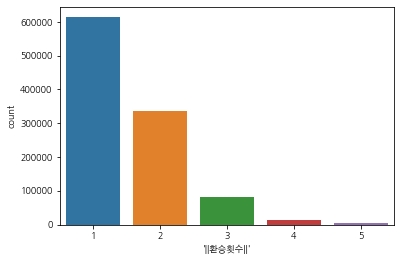

In [ ]:
sns.countplot(data = TripChain, x = "'||환승횟수||'")

- 1번 환승 외에 2-3번 환승을 주 타겟으로 함

In [ ]:
TripChain[(TripChain["'||환승횟수||'"]==2) |(TripChain["'||환승횟수||'"]==3)] # 환승 횟수가 2,3 번인 행 추출

,암호화카드번호||','||환승횟수||','||사용자구분||','||버스노선ID1||','||버스노선ID2||','||버스노선ID3||','||버스노선ID4||','||버스노선ID5||','||차량ID1||','||차량ID2||',...,'||총탑승시간||','||총소요시간||','||최초승차일시||','||최종하차일시||','||승차역ID1||','||승차역ID2||','||승차역ID3||','||하차역ID4||','||하차역ID5||','||최종하차역ID||'
0,900079696430,2,1,41002045.0,41002044.0,NaN,NaN,NaN,141771735.0,141771587.0,...,25,25,20180701052543,20180701064826,4116828.0,4150144.0,NaN,NaN,NaN,4116708.0
6,900079705567,3,1,41067109.0,NaN,41021002.0,NaN,NaN,141763724.0,999999999.0,...,39,39,20180701075731,20180701085359,4197606.0,1716.0,4116611.0,NaN,NaN,4116627.0
7,900079705567,3,1,41110050.0,NaN,41067109.0,NaN,NaN,999999999.0,999999999.0,...,41,41,20180701154641,20180701163919,9814.0,1708.0,4151651.0,NaN,NaN,4197607.0
10,900079971595,2,1,41031065.0,41027004.0,NaN,NaN,NaN,141701159.0,141701340.0,...,16,16,20180701091018,20180701093231,4116704.0,4108130.0,NaN,NaN,NaN,4151749.0
12,900079974199,2,1,41020001.0,41324001.0,NaN,NaN,NaN,141703938.0,141769942.0,...,21,21,20180701144943,20180701152035,4100084.0,9151651.0,NaN,NaN,NaN,4170526.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048560,900016612555,2,1,41031030.0,NaN,NaN,NaN,NaN,141701126.0,999999999.0,...,62,62,20180704134616,20180704145403,4179371.0,1872.0,NaN,NaN,NaN,4509.0
1048562,900016615035,2,4,41036108.0,41036032.0,NaN,NaN,NaN,141703650.0,141705507.0,...,12,12,20180704133539,20180704135156,4116860.0,4116948.0,NaN,NaN,NaN,4108215.0
1048563,900016615619,2,1,41036113.0,NaN,NaN,NaN,NaN,141705619.0,999999999.0,...,26,26,20180704080159,20180704083009,4116750.0,1711.0,NaN,NaN,NaN,1708.0
1048567,900016616508,2,1,41086011.0,41044001.0,NaN,NaN,NaN,141771523.0,141721061.0,...,54,54,20180704074240,20180704083724,4170942.0,4100021.0,NaN,NaN,NaN,4107053.0


In [ ]:
df_trip = pd.DataFrame(TripChain.groupby("'||승차역ID1||'")["암호화카드번호||'"].count()) # 승차역별 이용자 수

In [ ]:
df_trip['이비카드정류장ID'] = df_trip.index #인덱스값을 이비카드정류장 ID로 설정

In [ ]:
df_sta = station_table[["정류소명", "이비카드정류장ID", "emd","WGS84위도", "WGS84경도"]] # 사용할 열을 새로운 데이터셋에 저장

In [ ]:
trip_station = pd.merge(df_sta, df_trip, how = 'inner', on = "이비카드정류장ID") # df_sta, df_trip 합치기

In [ ]:
df_trip_3 = pd.DataFrame(TripChain.groupby("'||승차역ID2||'")["암호화카드번호||'"].count()) # 승차역2 별 이용자 수
df_trip_3['이비카드정류장ID'] = df_trip_3.index #인덱스값을 이비카드정류장 ID로 설정
trip_station_3 = pd.merge(df_sta, df_trip_3, how = 'inner', on = "이비카드정류장ID") # df_sta, df_trip3 합치기
trans_2= trip_station_3.sort_values("암호화카드번호||'",ascending = False).head(10) # 이용자 수가 많은 정류장 10개 추출
trans_2

,정류소명,이비카드정류장ID,emd,WGS84위도,WGS84경도,암호화카드번호||'
26,신창미션힐.송화초교,4100048.0,병점동,37.203300,127.038550,5062
125,병점역사거리,4151651.0,병점동,37.206917,127.035633,4913
131,동부출장소.병점초등학교,4100051.0,진안동,37.208800,127.034433,3512
25,홈플러스.벌말초교,4100049.0,병점동,37.203300,127.038133,3405
126,병점사거리,4170271.0,진안동,37.208383,127.034433,2638
124,병점역후문,4130131.0,진안동,37.206867,127.031833,2089
251,한빛마을(중),4197467.0,반송동,37.207567,127.069200,1442
75,수원대학교,4116671.0,봉담읍,37.214167,126.979150,1216
197,반월리큰고개,4108035.0,반월동,37.232550,127.064783,1146
203,메타폴리스(중),4170973.0,반송동,37.203700,127.067500,977


In [ ]:
df_trip_4 = pd.DataFrame(TripChain.groupby("'||승차역ID3||'")["암호화카드번호||'"].count()) # 승차역3 별 이용자 수
df_trip_4['이비카드정류장ID'] = df_trip_4.index #인덱스값을 이비카드정류장 ID로 설정
trip_station_4 = pd.merge(df_sta, df_trip_4, how = 'inner', on = "이비카드정류장ID") # df_sta, df_trip4 합치기
trans_1= trip_station_4.sort_values("암호화카드번호||'",ascending = False).head(10) # 이용자 수가 많은 정류장 10개 추출
trans_1

,정류소명,이비카드정류장ID,emd,WGS84위도,WGS84경도,암호화카드번호||'
110,병점역사거리,4151651.0,병점동,37.206917,127.035633,1340
109,병점역후문,4130131.0,진안동,37.206867,127.031833,654
115,동부출장소.병점초등학교,4100051.0,진안동,37.208800,127.034433,564
22,홈플러스.벌말초교,4100049.0,병점동,37.203300,127.038133,399
111,병점사거리,4170271.0,진안동,37.208383,127.034433,392
207,한빛마을(중),4197467.0,반송동,37.207567,127.069200,389
23,신창미션힐.송화초교,4100048.0,병점동,37.203300,127.038550,318
0,우미제일.전하리교회,4130121.0,석우동,37.212133,127.079383,248
64,수원대학교,4116671.0,봉담읍,37.214167,126.979150,227
167,다은마을(중),4195716.0,반송동,37.200417,127.067300,218


In [ ]:
bus_top_15 = trip_station.sort_values("암호화카드번호||'",ascending = False).head(20) # 버스정류장 이용 탑 20

In [ ]:
bus_top_40 = trip_station.sort_values("암호화카드번호||'",ascending = False).head(40) # 버스정류장 이용 탑 40

In [ ]:
df_trip2 = pd.DataFrame(TripChain.groupby("'||최종하차역ID||'")["암호화카드번호||'"].count())
df_trip2 # 하차역 별 이용자 수

,암호화카드번호||'
'||최종하차역ID||',
150.0,237
151.0,196
152.0,238
153.0,128
154.0,91
...,...
9636750.0,6
9636753.0,1
9636754.0,2


In [ ]:
df_trip2['이비카드정류장ID'] = df_trip2.index # 인덱스 값을 열로 설정

In [ ]:
trip_station_2 = pd.merge(df_sta, df_trip2, how = 'inner', on = "이비카드정류장ID") #df_sta, df_trip2 합치기 => 정류장 별 이용자 수
trip_station_2

,정류소명,이비카드정류장ID,emd,WGS84위도,WGS84경도,암호화카드번호||'
0,우미제일.전하리교회,4130121.0,석우동,37.212133,127.079383,496
1,한국농수산대학,4116684.0,봉담읍,37.229317,126.970433,37
2,대양2리,4130270.0,양감면,37.086417,126.942483,1
3,대양4리,4130272.0,양감면,37.090283,126.941967,3
4,대양1리,4130274.0,양감면,37.095567,126.939317,2
...,...,...,...,...,...,...
943,솔안고개,4130258.0,양감면,37.075350,126.963717,1
944,신왕리,4170309.0,양감면,37.083333,126.944217,2
945,빼골,4117380.0,정남면,37.180033,126.988250,130
946,괘랑2리.차운혁충신정려문,4117378.0,정남면,37.182833,126.993150,271


In [ ]:
bus_tail_15 = trip_station_2.sort_values("암호화카드번호||'",ascending = False).head(20) # 버스정류장 이용 하위 20

In [ ]:
bus_tail_40 = trip_station_2.sort_values("암호화카드번호||'",ascending = False).head(40) # 버스정류장 이용 하위 40

In [ ]:
bus_top_15

,정류소명,이비카드정류장ID,emd,WGS84위도,WGS84경도,암호화카드번호||'
77,신영통현대타운.두산위브,4108036.0,반월동,37.235467,127.062467,3721
63,신창미션힐.송화초교,4100048.0,병점동,37.203300,127.038550,3202
611,한림대병원(중),4199455.0,석우동,37.216633,127.078117,2539
418,메타폴리스(중),4170973.0,반송동,37.203700,127.067500,2489
62,홈플러스.벌말초교,4100049.0,병점동,37.203300,127.038133,2431
599,복합문화센터,4199435.0,반송동,37.201117,127.071100,2392
190,수원대학교,4116671.0,봉담읍,37.214167,126.979150,2343
569,동탄1동주민센터,4170243.0,반송동,37.206650,127.072567,2318
75,반월리큰고개,4108034.0,반월동,37.233000,127.064800,2178
414,삼성반도체후문,4130123.0,반월동,37.227667,127.070683,2075


In [ ]:
bus_tail_15.columns = ['정류소명',	'이비카드정류장ID',	'emd'	,'WGS84위도'	,'WGS84경도',	'이용자수']
bus_top_15.columns = ['정류소명',	'이비카드정류장ID',	'emd'	,'WGS84위도'	,'WGS84경도',	'이용자수']
bus_top_40.columns = ['정류소명',	'이비카드정류장ID',	'emd'	,'WGS84위도'	,'WGS84경도',	'이용자수']
bus_tail_40.columns = ['정류소명',	'이비카드정류장ID',	'emd'	,'WGS84위도'	,'WGS84경도',	'이용자수']
# 모든 테이블의 컬럼명을 변경

In [ ]:
total_bus = pd.concat([bus_top_15, bus_tail_15], axis = 0) # 상위20개와 하위20개 데이터셋을 합치기

In [ ]:
fig4 = px.scatter_mapbox(total_bus, lat = 'WGS84위도', lon = 'WGS84경도',
                       color = 'emd',
                       opacity = 0.4,
                       hover_name = '정류소명',
                       hover_data = {
                           'WGS84위도' : False,
                           'WGS84경도' : False,
                           'emd' : True
                       },
                       mapbox_style = "carto-positron",
                       center = dict(lat = 37.15, lon = 126.9),
                       zoom = 9)
fig4.show() # 상위, 하위 이용자 수의 버스정류장 시각화

In [ ]:
bus_top_15.head(10) # 상위 10개

,정류소명,이비카드정류장ID,emd,WGS84위도,WGS84경도,이용자수
77,신영통현대타운.두산위브,4108036.0,반월동,37.235467,127.062467,3721
63,신창미션힐.송화초교,4100048.0,병점동,37.203300,127.038550,3202
611,한림대병원(중),4199455.0,석우동,37.216633,127.078117,2539
418,메타폴리스(중),4170973.0,반송동,37.203700,127.067500,2489
62,홈플러스.벌말초교,4100049.0,병점동,37.203300,127.038133,2431
599,복합문화센터,4199435.0,반송동,37.201117,127.071100,2392
190,수원대학교,4116671.0,봉담읍,37.214167,126.979150,2343
569,동탄1동주민센터,4170243.0,반송동,37.206650,127.072567,2318
75,반월리큰고개,4108034.0,반월동,37.233000,127.064800,2178
414,삼성반도체후문,4130123.0,반월동,37.227667,127.070683,2075


In [ ]:
total_vis = bus_top_15.iloc[[0,1,2,3,4,5,7,9]] # 상위 하위에서 겹치는 정류장

In [ ]:
for idx, row in total_vis.iterrows():
    folium.Marker([row['WGS84위도'], row['WGS84경도']]).add_to(m)

m.add_child(folium.LatLngPopup()) #겹치는 정류장의 지도 시각화

### 4. 결론 <a class="anchor" id="chapter2"></a>

- 4.1 최적 노선 제시

 - 신영통현대타운.두산위브 +
신창미션힐.송화초교 + 
한림대병원 +
 메타폴리스 +
 홈플러스.벌말초교 +
복합문화센터 +
동탄1동주민센터 +
삼성반도체후문으로 이용자 수가 많은 정류장을 거치는 노선을 신설한다. 기존 노선의 경우 위의 정류장으로 환승을 할 수 있도록 위의 중 한 정류장을 노선에 추가 하는 방향으로 노선을 개선할 수 있다. 

- 4.2 활용 방안
 - 1. 이용자 수, 시간대에 맞춰 배차 간격 줄일 수 있다.

 - 2. 주요 정류장에 맞춘 새로운 노선을 신설한다. 

 - 3. 청소년을 대상으로 진행하고 있는 사업에서 
이용량이 적어 배차간격이 크고 배차되는 버스 차량의 수가 적은 동네에서 사용하는 교통비를 지원해주는 사업에 적용할 수 있다. 

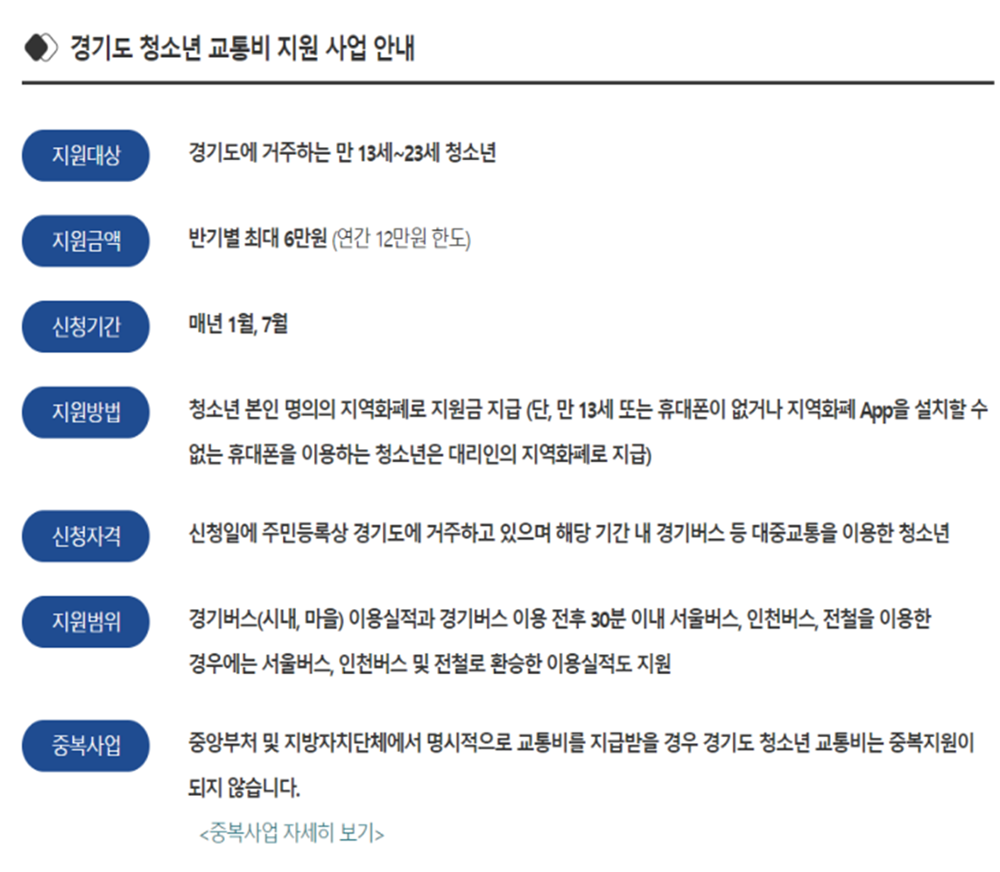